Created on Friday 15 January 2021

**Group 5 - Classification  
New document prediction unsupervised v0**

@authors : Alice Airault, Theo Vedis, Valentine Rossi, Maylin Vuillaume

This notebook tries to predict new articles, therefore articles that bring new information. To do this, we do unsupervised detection with Local Outlier Factor (LOF), Isolation Forest and One Support Vector Machine (One SVM) on word embedding with Bag of Words (BoW), TF-IDF made by not work-study, syntax features created by our group and BoW, Glove and word2vec of groupe G3.  
We find a function that allows us to make predictions and then at the end of the Notebook, we have tests to find the best parameters for our models and thus be able to compare the results. We visualize the results with a PCA.

# Import libraries

In [ ]:
import re
import nltk
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from wordcloud import WordCloud, STOPWORDS

from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize

from sklearn.manifold import TSNE
from sklearn.svm import OneClassSVM
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler

nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

# Create link between drive and notebook

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import data

In [ ]:
# Data without features syntax
data: pd.DataFrame = pd.read_csv(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/Data_With_Features_Syntax.csv")
data: pd.DataFrame = data.query("art_lang == 'fr'")
data.drop(["art_id", "art_content", "art_content_html", "art_extract_datetime", "art_lang", "art_title",
           "art_url", "src_name", "src_type", "src_url", "src_img", "art_auth", "art_tag", "title_postive_score", "title_negative_score",
           "title_polarity_score", "title_subjectivity_score", "netloc.com", "ratio_word_title_on_word"], axis=1, inplace=True)
data["average_word_sentence"] = data["average_word_sentence"].fillna(0)

In [ ]:
# All data
all_data: pd.DataFrame = pd.read_json(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/Data.json")

In [ ]:
# TF-IDF
tf_idf: pd.DataFrame = pd.read_csv(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/TF-IDF.csv")
tf_idf.drop(tf_idf[all_data['art_lang'] != 'fr'].index, inplace=True)

In [ ]:
# Bag-of-Words (BoW)
bow: pd.DataFrame = pd.read_csv(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/BOW.csv")
bow.drop(bow[all_data['art_lang'] != 'fr'].index, inplace=True)

In [ ]:
# Bag-of-Words (BoW) - G3
bow_g3: pd.DataFrame = pd.read_json(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/g3_BOW_v1.json")

# Create dataframe that with BoW data
data_bow_g3: pd.DataFrame = bow_g3.copy()

# Bag-of-Words (BoW) - G3
bow_g3.drop(["art_id", "art_content_clean_without_lem"], axis=1, inplace=True)

In [ ]:
# Glove
glove_v1: pd.DataFrame = pd.read_json("/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/GloVe_v1.json")
glove_v1.drop(["art_id", "art_content_clean_without_lem", "spacy_vector"], axis=1, inplace=True)

In [ ]:
# Word2vec
word2vec_v0: pd.DataFrame = pd.read_json(
    "/content/drive/MyDrive/G5 Inter-Promo 2021/Données/Input/word2vec_v0.json")

# Size of the list to know the number of columns in our word2vec
size_list: int = len(word2vec_v0['vect_art'][0])
df_word2vec: pd.DataFrame = word2vec_v0.copy()

# Create a column for each item in the list
for i in range(size_list):
    col_name: str = str(i)
    df_word2vec[col_name] = df_word2vec['vect_art'].apply(lambda x: x[i])

# Delete unnecessary columns for representation
df_word2vec.drop(['art_id', 'vect_art'], axis=1, inplace=True)

# Functions

## Word cloud with its preprocessing

In [ ]:
# Clean data
def preprocessing(sentence: str) -> str:
    """Documentation
    Parameters:
        data: 1 column of a dataframe especially choose because we want a column who contain only text

    Out (if exists):
        liste_return: Liste of all the text of the dataframe return with preprocessing applied
    """
    stop_words: set = set(stopwords.words('french'))
    pattern: list = ['(', ')', ':', ';', ',', '&', '/',
                     '"', "'", '\n', '©', 'n°', '-']

    if not isinstance(sentence, str):
        sentence: str = str(sentence)

    sentence: str = re.sub(r'\d', ' ', sentence)

    sentence: str = sentence.lower()

    for d in pattern:
        sentence: str = sentence.replace(d, " ")

    token_words: list = word_tokenize(sentence)
    filtre: type = [w for w in token_words if not w in stop_words]

    final_list: str = ""
    for word in filtre:
        final_list: str = final_list + word + " "
    
    return(final_list)

In [ ]:
# Generates a word cloud for an article
def wordcloud_art(text: str):
    """Documentation
    Parameters:
        text: The article that will be show on the word cloud
    """
    text: str = preprocessing(text)
    if len(text) > 0:
        wordcloud: str = WordCloud(relative_scaling=1.0,).generate(str(text))
        plt.imshow(wordcloud)
        plt.axis("off")
        plt.show()
        plt.close()
    else:
        print("The article have a size of 0.")

In [ ]:
# To visualize texts and their word clouds
def txt_wordcloud(bow_g3: pd.DataFrame, score: list, data_bow_g3: pd.DataFrame):
    """Documentation
    Parameters:
        bow_g3: Bag-of-Word og group 3 
        score: Prediction score of a model with 1 and -1 to say whether the article content is new or not
        data_bow_g3: Dataframe to retrieve article texts
    """
    # Create a new dataframe with the score
    df: pd.DataFrame = bow_g3.copy()
    df['index'] = bow_g3.index
    df['score'] = score

    # Retrieve the text of the articles
    mycolumns: list = ['art_id', 'art_content_clean_without_lem']
    data_bow: pd.DataFrame = data_bow_g3[mycolumns]

    # Merge the text with its decision score
    df_new: pd.DataFrame = pd.merge(
        data_bow, df, left_on='art_id', right_on='index')

    # Sort scores from smallest to largest
    df_sort: pd.DataFrame = df_new.sort_values(by='score')
    df_sort: pd.DataFrame = df_sort.reset_index()
    df_sort: pd.DataFrame = df_sort.drop(['level_0'], axis=1)

    # Display the first 7 most different texts and word clouds
    for i in range(7):
        txt: str = df_sort['art_content_clean_without_lem'][i]
        wordcloud = wordcloud_art(txt)
        print(txt)
        print(wordcloud)

## Visualization 2D or 3D

In [ ]:
# Representation of a PCA in 3D for the first method
def graph_3d(data: pd.DataFrame, prediction: pd.Series, name: tuple = ("New", "Old"), axes: tuple = (0, 1, 2), opacity: tuple = (1, 0.4)):
    """Documentation
    Parameters:
        data: the data that will be show on the plot
        prediction: the prediction that will be used to make distinction bewteen the differents class on the plot
        name: colunms names
        axes: axes of pca to display points
        opacity: the transparency of the points on the graph
    """
    # Normalisation
    sc: StandardScaler = StandardScaler()
    X: np.ndarray = sc.fit_transform(data)

    # PCA
    pca: PCA = PCA(n_components=10)
    X: np.ndarray = pca.fit_transform(X)

    # Predict
    data_plot: pd.DataFrame = pd.DataFrame(X)
    data_plot["prediction"] = prediction.replace([-1, 1], name)

    # Chart
    data_plot_new: pd.DataFrame = data_plot[data_plot["prediction"] == name[0]]
    data_plot_old: pd.DataFrame = data_plot[data_plot["prediction"] == name[1]]

    data: list = [go.Scatter3d(x=data_plot_old[axes[0]], y=data_plot_old[axes[1]], z=data_plot_old[axes[2]], name=name[1], mode='markers', marker=dict(size=6), opacity=opacity[1]),
                  go.Scatter3d(x=data_plot_new[axes[0]], y=data_plot_new[axes[1]], z=data_plot_new[axes[2]],
                               name=name[0], mode='markers', marker=dict(size=6), opacity=opacity[0]),
                  ]
    fig: go.Figure = go.Figure(data)
    fig.show()

# Unsupervised classification



## 1) Data - Syntax Features
  
In this first part, we test 2 models: Local Outlier Facor (LOF) and Isolation Forest on the syntactic features realized by our group.
  
### a) Local Outlier Facor (LOF)

In [ ]:
# Prediction syntactic features with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=2, contamination=0.01)
pred_features_lof: np.ndarray = clf.fit_predict(data)
pd.Series(pred_features_lof).value_counts()

 1    12024
-1      122
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_features_lof), axes=(0, 1, 2))

### b) Isolation Forest

In [ ]:
# Prediction syntactic features with Isolation Forest
clf: IsolationForest = IsolationForest(
    random_state=0, contamination=0.005, max_samples=1000, max_features=0.9, n_estimators=100)
pred_features_forest: np.ndarray = clf.fit_predict(data)
pd.Series(pred_features_forest).value_counts()

 1    12085
-1       61
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_features_forest))

## 2) TF-IDF
  
In this second part, we test 2 models: Local Outlier Facor (LOF) and Isolation 
Forest on the TF-IDF realized by the not work-study.
  
### a) Local Outlier Facor (LOF)

In [ ]:
# Prediction TF-IDF with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=3, contamination=0.1)
pred_tf_lof: np.ndarray = clf.fit_predict(tf_idf)
pd.Series(pred_tf_lof).value_counts()

 1    10931
-1     1215
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_tf_lof))

### b) Isolation Forest

In [ ]:
# Prediction TF-IDF with Isolation Forest
clf: IsolationForest = IsolationForest(random_state=0, contamination=0.005)
pred_tf_forest: np.ndarray = clf.fit_predict(tf_idf)
pd.Series(pred_tf_forest).value_counts()

 1    12102
-1       44
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_tf_forest))

## 3) Bag-of-Words (BoW)
  
In this last part, we test 2 models: Local Outlier Facor (LOF) and Isolation Forest on the Bag-of-Words (BoW) realized by the not work-study.
  
### a) Local Outlier Facor (LOF)

In [ ]:
# Prediction BoW with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=3, contamination=0.1)
pred_bow_lof: np.ndarray = clf.fit_predict(bow)
pd.Series(pred_bow_lof).value_counts()

 1    10931
-1     1215
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_bow_lof))

### b) Isolation Forest

In [ ]:
# Prediction BoW with Isolation Forest
clf: IsolationForest = IsolationForest(random_state=0, contamination=0.005)
pred_bow_forest: np.ndarray = clf.fit_predict(bow)
pd.Series(pred_bow_forest).value_counts()

 1    12085
-1       61
dtype: int64

In [ ]:
# Graph display
graph_3d(bow, pd.Series(pred_bow_forest))

## 4) Bag-of-Words (BoW) - G3
  
We test 3 models: Local Outlier Facor (LOF), Isolation Forest and One Support Vector Machine (One SVM) on the Bag-of-Words (BoW) realized by group G3.

### a) Local Outlier Facor (LOF)

In [ ]:
# Prediction BoW-G3 with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(n_neighbors=2, contamination=0.1)
pred_lof_g3: np.ndarray = clf.fit_predict(bow_g3)
pd.Series(pred_lof_g3).value_counts()

 1    6780
-1     753
dtype: int64

In [ ]:
# Graph display
graph_3d(bow_g3, pd.Series(pred_lof_g3), axes=(0, 1, 2))

### b) Isolation Forest

In [ ]:
# Prediction BoW-G3 with Isolation Forest
clf: IsolationForest = IsolationForest(random_state=0, contamination=0.015)
pred_forest_g3: np.ndarray = clf.fit_predict(bow_g3)
score_forest_g3: np.ndarray = clf.decision_function(bow_g3)
pd.Series(pred_forest_g3).value_counts()

 1    7420
-1     113
dtype: int64

In [ ]:
# Graph display
graph_3d(bow_g3, pd.Series(pred_forest_g3), axes=(0, 1, 2))

### c) One Support Vector Machine (One SVM)

In [ ]:
# Prediction BoW-G3 with One SVM
one_svm: OneClassSVM = OneClassSVM(gamma='auto', nu=0.03).fit(bow_g3)
pred_svm_g3: np.ndarray = one_svm.predict(bow_g3)
score_svm_g3: np.ndarray = clf.decision_function(bow_g3)
pd.Series(pred_svm_g3).value_counts()

 1    7305
-1     228
dtype: int64

In [ ]:
# Graph display
graph_3d(bow_g3, pd.Series(pred_svm_g3), axes=(0, 1, 2))

## 5) Glove

We test 3 models: Local Outlier Facor (LOF), Isolation Forest and One Support Vector Machine (One SVM) on the Glove realized by group G3.
    
### a) Local Outlier Facor (LOF)

In [ ]:
# Prediction Glove with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(contamination=0.03)
pred_glove_lof: np.ndarray = clf.fit_predict(glove_v1)
pd.Series(pred_glove_lof).value_counts()

 1    7307
-1     226
dtype: int64

In [ ]:
# Graph display
graph_3d(glove_v1, pd.Series(pred_glove_lof))

### b) Isolation Forest

In [ ]:
# Prediction Glove with Isolation Forest
clf: IsolationForest = IsolationForest(contamination=0.015)
pred_glove_forest: np.ndarray = clf.fit_predict(glove_v1)
pd.Series(pred_glove_forest).value_counts()

 1    7420
-1     113
dtype: int64

In [ ]:
# Graph display
graph_3d(glove_v1, pd.Series(pred_glove_forest))

### c) One Support Vector Machine (One SVM)

In [ ]:
# Prediction Glove with One SVM
one_svm: OneClassSVM = OneClassSVM(gamma='auto', nu=0.03).fit(glove_v1)
pred_svm_glove: np.ndarray = one_svm.predict(glove_v1)
pd.Series(pred_svm_glove).value_counts()

 1    7306
-1     227
dtype: int64

In [ ]:
# Graph display
graph_3d(glove_v1, pd.Series(pred_svm_glove), axes=(0, 1, 2))

## 5) Word2vec

We test 3 models: Local Outlier Facor (LOF), Isolation Forest and One Support Vector Machine (One SVM) on the Word2vec realized by group G3.

### a) Local Outlier Facor (LOF)

In [ ]:
df: pd.DataFrame = df_word2vec.copy()

In [ ]:
# Prediction Word2vec with LOF
clf: LocalOutlierFactor = LocalOutlierFactor(contamination=0.03)
pred_lof: np.ndarray = clf.fit_predict(df)
pd.Series(pred_lof).value_counts()

 1    7306
-1     226
dtype: int64

In [ ]:
# Graph display
graph_3d(df, pd.Series(pred_lof))

### b) Isolation Forest

In [ ]:
# Prediction Word2vec with Isolation Forest
clf: IsolationForest = IsolationForest(contamination=0.015)  # 0.015
pred_forest: np.ndarray = clf.fit_predict(df)
pd.Series(pred_forest).value_counts()

 1    7419
-1     113
dtype: int64

In [ ]:
# Graph display
graph_3d(df, pd.Series(pred_forest))

### c) One Support Vector Machine (One SVM)

In [ ]:
# Prediction Word2vec with One SVM
one_svm: OneClassSVM = OneClassSVM(gamma='auto', nu=0.03).fit(df)
pred_svm: np.ndarray = one_svm.predict(df)
pd.Series(pred_svm).value_counts()

 1    7306
-1     226
dtype: int64

In [ ]:
# Graph display
graph_3d(df, pd.Series(pred_svm), axes=(0, 1, 2))

# Word cloud + Text for BoW G3

The best results for PCA are for the BoW data of the G3 group with the unsupported model: Isolation Forest and One SVM. So we chose to look at the word clouds and concidered articles as new.

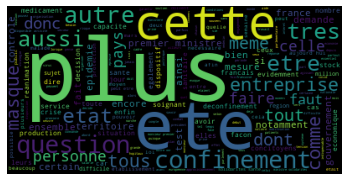

president richard ferrand rapporteur general chers collegues membres mission information reunis visioconference entendre premier ministre ministre solidarites sante monsieur premier ministre monsieur ministre tiens avant tout nom tous remercier avoir repondu rapidement demande etre presents aujourd hui devant mission information chacun sait ici mobilisation engagement tous instants comme celui membres gouvernement ensemble acteurs sous autorite faites face cette crise sans precedent agit fois tout faire ralentir progression virus notamment mesures confinement inedites apporter systeme soins sous tension acteurs tous moyens dont besoin enfin garantir malgre tout continuite activites indispensables vie francais permettez tout abord avoir pensee ensemble familles endeuillees tiens dire combien partageons peine comme partageons souffrances toutes celles tous ceux touches maladie inquietent proche douleur representants nation tout entiere agir mobiliser organiser repartir orchestrer cette l

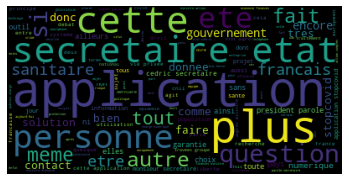

president ordre jour appelle declaration gouvernement suivie debat vote relative innovations numeriques lutte contre epidemie covid application article constitution preambule rappelle seance deroule conditions respect regles sanitaires mises place depuis mois mars hemicycle fait objet nettoyage desinfection avant apres chaque seance micros desinfectes apres chaque intervention invite chacune chacun veiller respect distances securite sorties salle seances devront exclusivement effectuer portes situees pourtour hemicycle rappelle egalement orateurs exprimeront depuis place sans monter tribune seance organisera trois temps apres declaration gouvernement parole donnee orateur chaque groupe ensuite apres eventuelle reponse gouvernement deroulera seance onze questions reponses enfin procederons vote scrutin public cette declaration application article reglement parole mme garde sceaux ministre justice mme nicole belloubet garde sceaux ministre justice monsieur president mesdames messieurs se

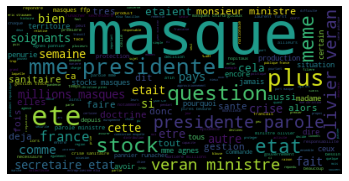

mme presidente ordre jour appelle questions decisions relatives gestion stocks masques rappelle conference presidents fixe deux minutes duree maximale chaque question chaque reponse parole jean christophe lagarde jean christophe lagarde monsieur ministre solidarites sante entre dit millions masques destines grand public soignants ete detruits affirme etait fait peremption alors realite plus souvent elastiques periment apparition moisissures bref stock constitue cours annees precedentes ete detruit resultat lorsque besoin masques plus conduit gouvernement expliquer successivement etaient necessaires puis forcement indispensables puis si faciles utiliser voit desormais rues france pourtant academie nationale medecine cote haut conseil sante publique autre indiquaient masques constituaient cas epidemie grave paiement assurance pouvant donner sentiment depense rien constituant autant protections individuelles fond question simple pourquoi lorsque masques ete detruits stocks ete reconstitue

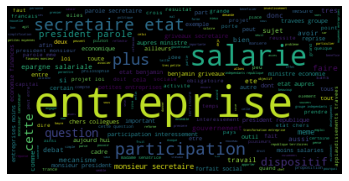

president ordre jour appelle debat organise demande groupe independants republique territoires theme participation entreprise outil croissance perspectives rappelle auteur debat disposera temps parole dix minutes compris replique puis gouvernement repondra vont tout abord exprimer orateurs groupe demande debat president parole secretaire etat benjamin griveaux secretaire etat aupres ministre economie finances monsieur president mesdames messieurs senateurs tres heureux etre ici crois muriel penicaud ministre travail egalement aime participer travaux sans doute beaucoup apprendre experience assurement role important jouer debats semaines mois viennent cette question centrale participation interessement entretien televise octobre president republique rappele cette question ferait objet grande reflexion cadre plan action croissance transformation entreprises dont bruno maire meme lance travaux lundi dernier hotel ministres bercy pourquoi utile revisiter dispositifs comme decool rappele qu

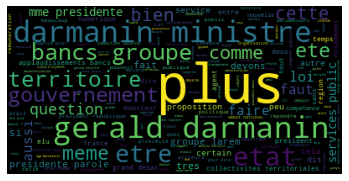

mme presidente ordre jour appelle debat organisation etat services publics conference presidents decide organiser debat deux parties premier temps entendrons orateurs groupes puis gouvernement procederons ensuite sequence questions reponses mme presidente parole ministre action comptes publics gerald darmanin ministre action comptes publics permettez tout abord remercier orateurs chacun groupes helas beaucoup entendu remerciements particulier part ceux critiquent action gouvernement agents services publics alors parlons avenir decisions prendrons collectivement travaillent chaque jour fonction publique territoriale etat sante bien etre concitoyens applaudissements bancs groupe larem plusieurs bancs groupe lr critique facile remercier parfois difficile ugo bernalicis jour aussi remercie monsieur ministre gerald darmanin ministre vrai agents services publics sous tous gouvernements republique singulierement gouvernement car demandons beaucoup temoignent engagement republicain cheville co

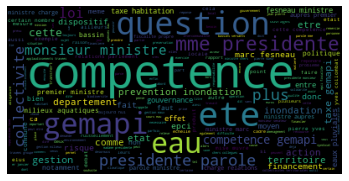

mme presidente ordre jour appelle debat organise demande groupe rassemblement democratique social europeen theme bilan perspectives competence gestion milieux aquatiques prevention inondations allons proceder debat sous forme serie questions reponses dont modalites ete fixees conference presidents rappelle auteur demande dispose temps parole huit minutes puis gouvernement repond duree equivalente mme presidente parole ministre marc fesneau ministre aupres premier ministre charge relations parlement madame presidente mesdames messieurs senateurs vu aleas climatiques face risques crues intensite leurs effets logique gemapi forte solidaire gestion cours eau celle risque inondation liees elles obligent penser conserve gestion zones extension naturelle crues entretien ouvrages protection contre inondations appelle defi technique ingenierie financier raison laquelle gestion eau prevention inondations devaient etre rapprochees donc heureux debat aujourd hui sujet loi janvier modernisation act

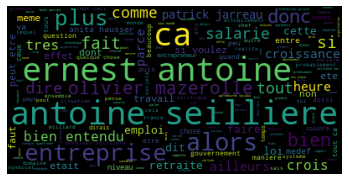

olivier mazerolle bonsoir monsieur seilliere croissance rendez forte stimulante amene gouvernement revoir previsions hausse confirmer intention baisser prelevements obligatoires moins point cette annee contexte medef engage syndicats negociations approfondies changer dialogue social proposition innovante suscite aussi craintes certes entreprises attendent bien changements salaries gagner dont allons parler grand jury auquel participe anita hausser patrick jarreau grand jury retransmis direct rtl lci monde publiera edition demain essentiel declarations monsieur seilliere vendredi dernier premiere fois depuis plus deux ans depuis coup tonnerre heures octobre etes retrouves syndicats autour premier ministre lionel jospin parler doivent etre rapports sociaux alors pacification vue rapports entre medef gouvernement ernest antoine seilliere aspirons bien entendu retrouver pleinement role partenaire social representant entrepreneurs jouant pleinement parti societe francaise representons fond 

In [ ]:
# Word cloud for BoW G3 with Isolation Forest
txt_wordcloud(bow_g3, score_forest_g3, data_bow_g3)

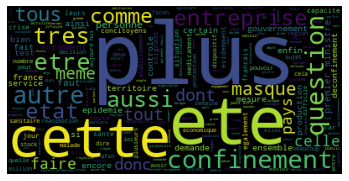

president richard ferrand rapporteur general chers collegues membres mission information reunis visioconference entendre premier ministre ministre solidarites sante monsieur premier ministre monsieur ministre tiens avant tout nom tous remercier avoir repondu rapidement demande etre presents aujourd hui devant mission information chacun sait ici mobilisation engagement tous instants comme celui membres gouvernement ensemble acteurs sous autorite faites face cette crise sans precedent agit fois tout faire ralentir progression virus notamment mesures confinement inedites apporter systeme soins sous tension acteurs tous moyens dont besoin enfin garantir malgre tout continuite activites indispensables vie francais permettez tout abord avoir pensee ensemble familles endeuillees tiens dire combien partageons peine comme partageons souffrances toutes celles tous ceux touches maladie inquietent proche douleur representants nation tout entiere agir mobiliser organiser repartir orchestrer cette l

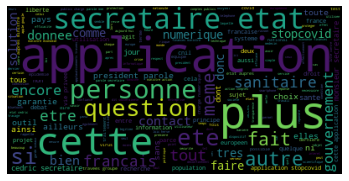

president ordre jour appelle declaration gouvernement suivie debat vote relative innovations numeriques lutte contre epidemie covid application article constitution preambule rappelle seance deroule conditions respect regles sanitaires mises place depuis mois mars hemicycle fait objet nettoyage desinfection avant apres chaque seance micros desinfectes apres chaque intervention invite chacune chacun veiller respect distances securite sorties salle seances devront exclusivement effectuer portes situees pourtour hemicycle rappelle egalement orateurs exprimeront depuis place sans monter tribune seance organisera trois temps apres declaration gouvernement parole donnee orateur chaque groupe ensuite apres eventuelle reponse gouvernement deroulera seance onze questions reponses enfin procederons vote scrutin public cette declaration application article reglement parole mme garde sceaux ministre justice mme nicole belloubet garde sceaux ministre justice monsieur president mesdames messieurs se

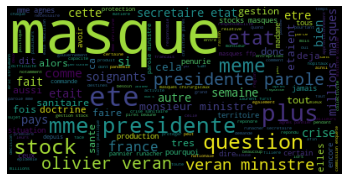

mme presidente ordre jour appelle questions decisions relatives gestion stocks masques rappelle conference presidents fixe deux minutes duree maximale chaque question chaque reponse parole jean christophe lagarde jean christophe lagarde monsieur ministre solidarites sante entre dit millions masques destines grand public soignants ete detruits affirme etait fait peremption alors realite plus souvent elastiques periment apparition moisissures bref stock constitue cours annees precedentes ete detruit resultat lorsque besoin masques plus conduit gouvernement expliquer successivement etaient necessaires puis forcement indispensables puis si faciles utiliser voit desormais rues france pourtant academie nationale medecine cote haut conseil sante publique autre indiquaient masques constituaient cas epidemie grave paiement assurance pouvant donner sentiment depense rien constituant autant protections individuelles fond question simple pourquoi lorsque masques ete detruits stocks ete reconstitue

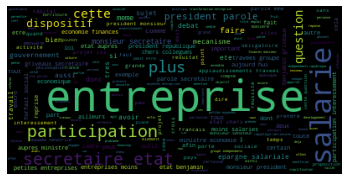

president ordre jour appelle debat organise demande groupe independants republique territoires theme participation entreprise outil croissance perspectives rappelle auteur debat disposera temps parole dix minutes compris replique puis gouvernement repondra vont tout abord exprimer orateurs groupe demande debat president parole secretaire etat benjamin griveaux secretaire etat aupres ministre economie finances monsieur president mesdames messieurs senateurs tres heureux etre ici crois muriel penicaud ministre travail egalement aime participer travaux sans doute beaucoup apprendre experience assurement role important jouer debats semaines mois viennent cette question centrale participation interessement entretien televise octobre president republique rappele cette question ferait objet grande reflexion cadre plan action croissance transformation entreprises dont bruno maire meme lance travaux lundi dernier hotel ministres bercy pourquoi utile revisiter dispositifs comme decool rappele qu

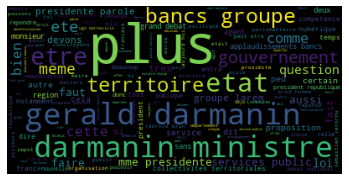

mme presidente ordre jour appelle debat organisation etat services publics conference presidents decide organiser debat deux parties premier temps entendrons orateurs groupes puis gouvernement procederons ensuite sequence questions reponses mme presidente parole ministre action comptes publics gerald darmanin ministre action comptes publics permettez tout abord remercier orateurs chacun groupes helas beaucoup entendu remerciements particulier part ceux critiquent action gouvernement agents services publics alors parlons avenir decisions prendrons collectivement travaillent chaque jour fonction publique territoriale etat sante bien etre concitoyens applaudissements bancs groupe larem plusieurs bancs groupe lr critique facile remercier parfois difficile ugo bernalicis jour aussi remercie monsieur ministre gerald darmanin ministre vrai agents services publics sous tous gouvernements republique singulierement gouvernement car demandons beaucoup temoignent engagement republicain cheville co

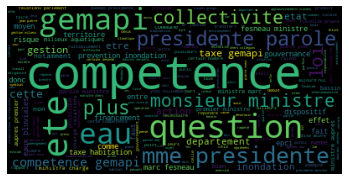

mme presidente ordre jour appelle debat organise demande groupe rassemblement democratique social europeen theme bilan perspectives competence gestion milieux aquatiques prevention inondations allons proceder debat sous forme serie questions reponses dont modalites ete fixees conference presidents rappelle auteur demande dispose temps parole huit minutes puis gouvernement repond duree equivalente mme presidente parole ministre marc fesneau ministre aupres premier ministre charge relations parlement madame presidente mesdames messieurs senateurs vu aleas climatiques face risques crues intensite leurs effets logique gemapi forte solidaire gestion cours eau celle risque inondation liees elles obligent penser conserve gestion zones extension naturelle crues entretien ouvrages protection contre inondations appelle defi technique ingenierie financier raison laquelle gestion eau prevention inondations devaient etre rapprochees donc heureux debat aujourd hui sujet loi janvier modernisation act

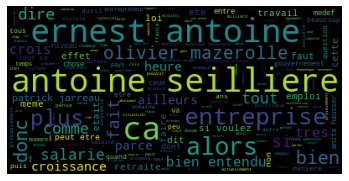

olivier mazerolle bonsoir monsieur seilliere croissance rendez forte stimulante amene gouvernement revoir previsions hausse confirmer intention baisser prelevements obligatoires moins point cette annee contexte medef engage syndicats negociations approfondies changer dialogue social proposition innovante suscite aussi craintes certes entreprises attendent bien changements salaries gagner dont allons parler grand jury auquel participe anita hausser patrick jarreau grand jury retransmis direct rtl lci monde publiera edition demain essentiel declarations monsieur seilliere vendredi dernier premiere fois depuis plus deux ans depuis coup tonnerre heures octobre etes retrouves syndicats autour premier ministre lionel jospin parler doivent etre rapports sociaux alors pacification vue rapports entre medef gouvernement ernest antoine seilliere aspirons bien entendu retrouver pleinement role partenaire social representant entrepreneurs jouant pleinement parti societe francaise representons fond 

In [ ]:
# Word cloud for BoW G3 with One SVM
txt_wordcloud(bow_g3, score_svm_g3, data_bow_g3)